# Aim of Analysis

Pick your favourite  forest and analyse and share your findings

Following the analysis guidelines from the data analysis repo,

I will make global anlysis first then narrow my analysis to regional analysis

In the global analysis I did the following:

* [Visualised to see all the types of forests in the world and their locations from the data](#Forests-in-the-world)
* I picked interest in the tropical dry forests and analysed the data to see the following properties of tropical dry forests in the world:
    * [Agroecological zones](#AgroEcological-zones-of-forest)
    * [Biomes](#Terrestial-Ecoregions)
    * [Climate](#Climate)
    * [Soil resources](#Soil)
    * [Water scarcity](#-scarcity)
    * [Land resource dominance](#Land-resource-dominant-cover)
    * [Soil Resource Nutrient Avilability](#Soil-Resource-Nutrient-Avilability)
    * [Terrain sustainability](#Terrain-sustainability)
    * [Rooting conditions](#Rooting-conditions)

# **DATASETS DESCTRIPTION**

> The datasets is gotten from the data library [here](https://datasets.mojaglobal.workers.dev/0:/)

1. **Bioclimatic & Ecological Zones**

  * `bio` - **Holdridge Life Zones** (data source: HoldridgeLifeZones.json)
  * `tropical_dry_forest` - **Tropical forests** (data source: filtered from bio geodatframe)
  * `agros` - **Global AgroEcological Zones** (data source: GlobalAgroEcologicalZones_GAEZ.geojson)
  * `terreco_df` - **Terrestrial Ecoregions of the World** (data source: TerrestrialEcoregionsoftheWorld_WWF.geojson)
  * `terreco` - **Terrestrial Ecoregions of tropical dry forests** ( data source: clipped from terreco_df)
  * `rst_water` - **Water Scarcity** (data source: WaterScarcity_GAEZ.tif)
  * `rst_dom` - **Land Resource Dominant Land Cover** (data source: LandResource_DomLandCover_GAEZ.tif)
  * `nutrient` - **Soil Resources Nutrient Availability** (data source: SoilResources_NutrientAvailability_GAEZ.tif)
  * `terrsuit` - **Soil Resources Rainfed Soil Terrain Suitability**(data source: SoilResources_RainfedSoilTerrainSuitability_GAEZ.tif)
  * `rst_root` - **Soil Resources Rooting Conditions** (SoilResources_RootingConditions_GAEZ.tif)

2. **Climate**
  * `climates` - **IPCC Climate Zone map vector** (data source: IPCC_ClimateZoneMap_Vector.geojson)

3. **Soil**
  * `soil` - **World soil resource map** (data source: World Soil Resources/World_Soil_Resources_wgs84.geojson)


In [29]:
#import necessary libraries

import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import requests
import folium
import rasterio as rst
import earthpy as ep
import warnings
warnings.filterwarnings('ignore')
import rasterio.plot
import earthpy.plot

In [30]:
class Read():
    
    """
    A class used to read and clean data 

    ...

    Attributes
    ----------
    url : str
        the link or path to the file
    columns : list
        The column so retrieve from the data

    Methods
    -------
    retrieve(json = False)
        fetches data from the internet
    """


    def __init__(self, url, columns = None):
        """
        Parameters
        ----------
        
        url : str
            the link or path to the file
        sound : list
            The column so retrieve from the data
        """
        self.url = url
        self.columns = columns
        
    def retrieve_data(self, json):
        """fetches data from the internet
         Parameters
        ----------
        
        json : bool
            If the file is of json format
        """
        self.req = requests.get(self.url)
        if json:
            #if data is of json format, convert it to string
            self.req = str(self.req.text)
        else:
            self.req = self.req.content
        return self.req

    def wrangle(self,online = False, replace_values = False, column_to_change = None,
               old_values = None, new_values = None, filter_columns = False):
        """Read in and wrangle data
         Parameters
        ----------
        
        online : bool
            If the data is retrieved from the internet
        replace_values : bool
            if values in the data should be changed
        column_to_change: str
            column of values to change
        old_values : list
            the original values in the data
        new_values : list
            the new values to change initial values to
        filter_columns : bool
            if to select columns based on columns passed to the class constructor
        """
        if online:
            self.url = self.req
        #read in file
        self.df = gpd.read_file(self.url)
        #replace blank, unknown values with numpy.nan
        self.df = self.df.replace(['n/a', 'Unknown', ' '], np.nan)
        #make columns lower case
        self.df.columns = self.df.columns.str.lower()
        if replace_values:
            self.df[column_to_change] = self.df[column_to_change].replace(old_values, new_values)
        if filter_columns:
            self.df = self.df[self.columns]
        #drop missing values
        self.df = self.df.dropna()
        #set coordinate reference system to 4326
        self.df.geometry = self.df.geometry.to_crs(4326)
        #Extract centroid
        self.df['centroid'] = self.df.geometry.centroid
        return self.df

In [31]:
def folium_plot(title, data, column_name):
    """
     Make folium map showing location of forests
        Parameters
        ----------
        
        title : str
            title of visualization
        data : GeoDataFrame
            The data on forests to plot on the map
        column_name : str
            The name of the column in data based on which data is plotted on the folium map
"""
    loc = title
    title_html = '''
                     <h3 align="center" style="font-size:16px"><b>{}</b></h3>
                 '''.format(loc)   

    m = folium.Map(location=[-8.7832, 34.5085], zoom_start=1.5, tiles='CartoDB positron',
                   min_zoom = 1.5, max_zoom = 2)

    for _, r in data.iterrows():
        # Without simplifying the representation of each area,
        # the map might not be displayed
        sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.001)
        geo_j = sim_geo.to_json()
        geo_j = folium.GeoJson(data=geo_j,
                               style_function=lambda x: {'fillColor': 'orange'})
        folium.Popup(r[column_name]).add_to(geo_j)
        geo_j.add_to(m)

    m.get_root().html.add_child(folium.Element(title_html))
    return m

In [32]:
def plot_within(data, column, title, ncol):
    """
     return map on forests characteristics based on data
        Parameters
        ----------
        
        title : str
            title of visualization
        data : GeoDataFrame
            The data on charactersistics (such as soil type e.t.c)
        column_name : str
            The name of the column in data based on which data is plotted
        """
    ax = data.plot(column = column,  figsize= (20, 8), legend = True, cmap = 'YlOrRd',
                        legend_kwds = {'ncol': ncol, 'loc' : 'center', 'bbox_to_anchor': (1.2, 0.5)})
    tropical_dry_forest.plot(ax = ax, color = 'black')
    plt.title(title);

In [33]:
def plot_number(data, column, title):
    """
     return barplot on counts to show most occuring characteristics nof tropicqal dry forests
        Parameters
        ----------
        
        title : str
            title of visualization
        data : GeoDataFrame
            The data on chjaracteristics of forests to plot 
        column : str
            The name of the column in data based on which data is plotted on the folium map
        """
    gdf = gpd.clip(data, tropical_dry_forest)
    values = gdf[column].value_counts().to_list()
    zones = gdf[column].value_counts().index.to_list()
    sns.barplot(y = zones, x = values, color = 'brown')
    plt.title(title,
             fontsize = 19, pad = 2);

# **Global Analysis**

### Administration

<b> View location and boundaries of different forests in the world </b>

In [34]:
url = 'https://datasets.mojaglobal.workers.dev/0:/Bioclimatic&EcologicalZones/HoldridgeLifeZones.json'
bio = Read(url)
bio.retrieve_data(json = True)
bio = bio.wrangle(online = True)

#filter forests
a = bio['desc'].str.contains('forest')
bio = bio[a].reset_index()

bio.head(2)

,index,fid,area,perimeter,holdrig_,holdrig_id,zone,case_,frequency,desc,symbol,geometry,centroid
0,110,110,0.75,4,112,197,10,11,254,Boreal wet forest,20,"POLYGON ((24.50000 71.00000, 24.00000 71.00000...",POINT (23.75000 70.75000)
1,121,121,0.25,2,123,196,10,11,254,Boreal wet forest,20,"POLYGON ((21.00000 70.50000, 21.00000 70.00000...",POINT (21.25000 70.25000)


##### Forests in the world

In [35]:
folium_plot('Location of forests in the world', bio, 'desc')

### I am interested in the Tropical dry forests

<b> I want to view locations and boundaries of tropical dry forests in the world</b>

In [36]:
# subset tropical dry forest
tropical_dry_forest = bio[bio['desc'] == 'Tropical dry forest']

tropical_dry_forest.head(2)

,index,fid,area,perimeter,holdrig_,holdrig_id,zone,case_,frequency,desc,symbol,geometry,centroid
971,2365,2365,0.25,2,2367,1552,36,37,201,Tropical dry forest,214,"POLYGON ((73.00000 34.00000, 72.50000 34.00000...",POINT (72.75000 33.75000)
992,2444,2444,1.25,6,2446,1563,36,37,201,Tropical dry forest,214,"POLYGON ((74.50000 33.00000, 74.50000 32.50000...",POINT (75.25000 32.25000)


In [37]:
#save file

# forest = tropical_dry_forest.drop(['centroid'], axis = 1)
# forest.to_file('data/ favourite_forest.geojson')

In [38]:
folium_plot('Location of Tropical forests in the world', tropical_dry_forest, 'desc')

###### AgroEcological zones of forest

In [39]:
file_path = 'data/Bioclimatic and ecological zones/GlobalAgroEcologicalZones_GAEZ.geojson'


agros = ['Steep terrain', 'Artic/Cold', 'Desert/Arid', 'Irrigated Soils', 'Hydromorphic soils', 
 'Dry, good soils', 'Dry, moderate soils', 'Dry, poor soils', 'Moist, good soils', 
 'Moist, moderate soils', 'Moist, poor soils', 'Sub-humid, good soils', 'Sub-humid, moderate soils', 
 'Sub-humid, poor soils', 'Humid, good soils', 'Humid, moderate soils', 'Humid, poor soils', 'Water']

numb = [i for i in range(1, 19)]

agroeco_df = Read(file_path)
agroeco_df = agroeco_df.wrangle(replace_values = True, column_to_change = 'value',
               old_values = numb, new_values = agros)
agroeco_df.head(2)

,value,geometry,centroid
0,Steep terrain,"POLYGON ((-33.50000 83.65000, -33.50000 83.500...",POINT (-33.19122 83.57635)
1,Steep terrain,"POLYGON ((-37.85000 83.60000, -37.85000 83.500...",POINT (-37.75000 83.55000)


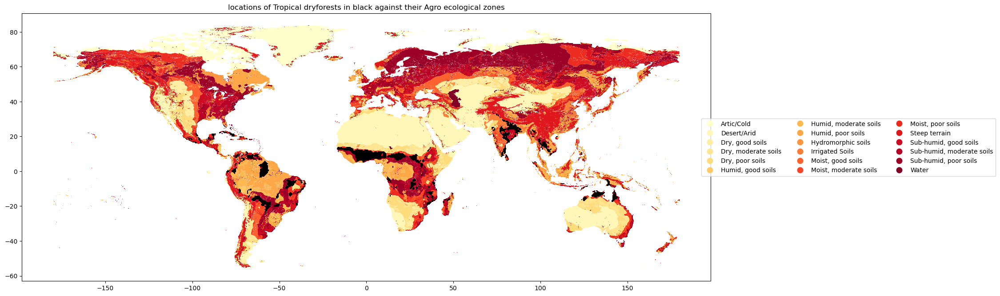

In [40]:
plot_within(agroeco_df, 'value', 
            'locations of Tropical dryforests in black against their Agro ecological zones', 3)

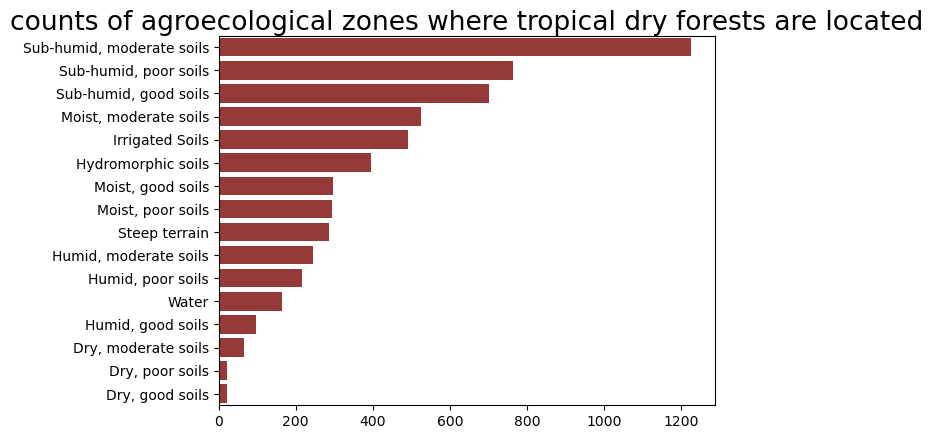

In [41]:
# filter the agroecological zones of tropical dry forests
plot_number(agroeco_df, 'value', 
            'counts of agroecological zones where tropical dry forests are located')

<b>from the visualisations above, the agroecological zones of the tropical forests are mostly subhumid soils</b>

###### Terrestial Ecoregions

In [42]:
biomes = ['Tropical and subtropical moist broadleaf forests', 'Tropical and subtropical dry broadleaf forests',
'Tropical and subtropical coniferous forests', 'Temperate broadleaf and mixed forests'
'Temperate coniferous forests', 'Boreal forests/taiga', 'Tropical and subtropical grasslands', 
'savannas, and shrublands', 'Temperate grasslands, savannas, and shrublands',
'Flooded grasslands and savannas', 'Montane grasslands and shrublands', 'Tundra (Arctic)',
'Mediterranean forests, woodlands, and scrub or sclerophyll forests',
'Deserts and xeric shrublands','Mangrove']
initial = [i for i in range(1, 15)]

In [43]:
# It has null values so using the read class will drop all rows

columns = ['eco_name', 'biome', 'geometry']
file_path = 'data/Bioclimatic and ecological zones/TerrestrialEcoregionsoftheWorld_WWF.geojson'
terreco_df = Read(file_path, columns)
terreco_df = terreco_df.wrangle(replace_values = True, column_to_change = 'biome',
               old_values = initial, new_values = biomes, filter_columns = True)
terreco_df.head(2)

,eco_name,biome,geometry,centroid
0,Northern Mesoamerican Pacific mangroves,Mangrove,"POLYGON ((-112.30433 29.33480, -112.29035 29.3...",POINT (-112.31337 29.35268)
1,Northern Mesoamerican Pacific mangroves,Mangrove,"POLYGON ((-112.19639 29.20719, -112.19669 29.2...",POINT (-112.20791 29.21550)


#save file

fav_forest = terreco[terreco['biome'] == 'Tropical and subtropical moist broadleaf forests']
fav_forest = fav_forest.drop(['centroid'], axis = 1)
fav_forest.to_file('data/forest.geojson')

In [44]:
terreco = gpd.clip(terreco_df, tropical_dry_forest)
folium_plot('Biomes of tropical dry forests in the world', terreco, 'biome')

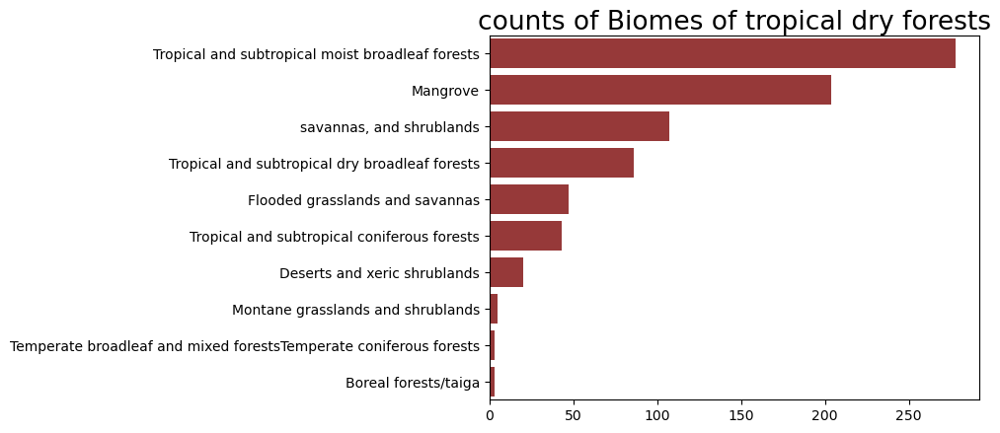

In [45]:
plot_number(terreco_df, 'biome', 'counts of Biomes of tropical dry forests')

<b> From the visualisations, most of the tropical dry forests are Tropical and subtropical moist broadleaf forests, Mangrove, Savannas and shrublands

###### Climate

In [46]:
climates = ['Warm Temperate Moist', 'Warm Temperate Dry', 'Cool Temperate Moist', 'Cool Temperate Dry', 
'Polar Moist', 'Polar Dry', 'Boreal Moist', 'Boreal Dry', 'Tropical Montane', 'Tropical wet',
 'Tropical Moist', 'Tropical Dry']

numbers = [i for i in range(1, 13)]

In [47]:
url = 'data/climate/IPCC_ClimateZoneMap_Vector.geojson'

climate = Read(url)
climate = climate.wrangle(replace_values = True, column_to_change = 'class_name',
               old_values = numbers, new_values = climates)
climate.head(2)


,class_name,geometry,centroid
0,0,"MULTIPOLYGON (((-37.65000 83.50000, -37.65000 ...",POINT (-37.57500 83.45000)
1,0,"MULTIPOLYGON (((-38.75000 83.40000, -38.75000 ...",POINT (-38.70000 83.37500)


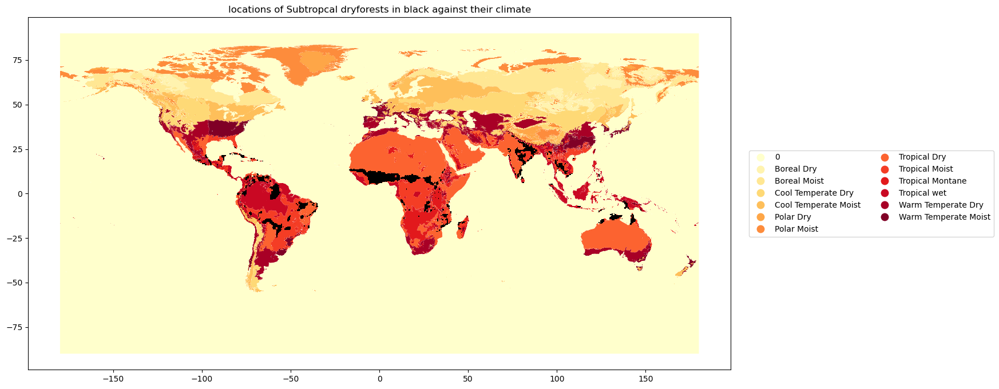

In [48]:
plot_within(climate, 'class_name', 
            'locations of Subtropcal dryforests in black against their climate', 2)

<b>As expected the forests fall within the tropical climate zones

###### Soil

In [49]:
url = 'https://datasets.mojaglobal.workers.dev/0:/Soil/World%20Soil%20Resources/World_Soil_Resources_wgs84.geojson'

soil_resource = Read(url)
soil_resource.retrieve_data(json = True)
soil_resource = soil_resource.wrangle(online = True)# to read area_geo


soil_resource.head(2)

,sname,ipcc,geometry,centroid
0,AB,Albeluvisol,"MULTIPOLYGON (((31.77594 49.15567, 31.98717 49...",POINT (22.57850 57.24980)
1,AC,Acrisol,"MULTIPOLYGON (((116.05041 -2.90441, 116.04652 ...",POINT (19.45196 8.64741)


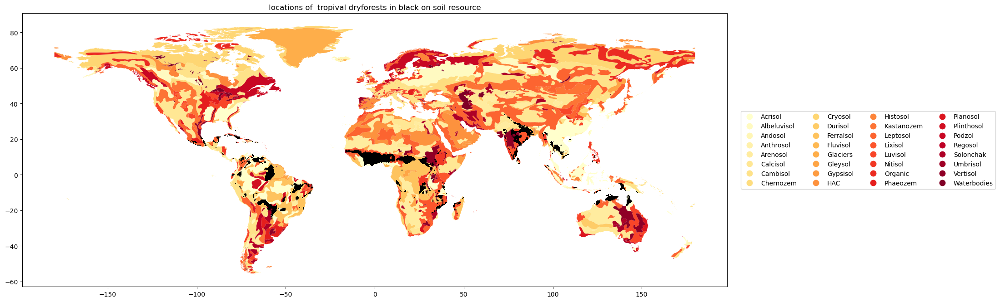

In [50]:
plot_within(soil_resource, 'ipcc', 
            'locations of  tropival dryforests in black on soil resource', 4)

<b> The forests are of different soil types in different locations</b>

###### Water scarcity

In [51]:
def plot_tiffs(path, cmap, title):
    img = rst.open(path)
    img_ = img.read()
    plot_ext = rst.plot.plotting_extent(img)
    fig, ax = plt.subplots()
    ep.plot.plot_bands(img_,
                  title= title,
                  cmap= cmap, ax = ax, extent = plot_ext)
    tropical_dry_forest.plot(ax = ax, color = 'red')

    plt.show()

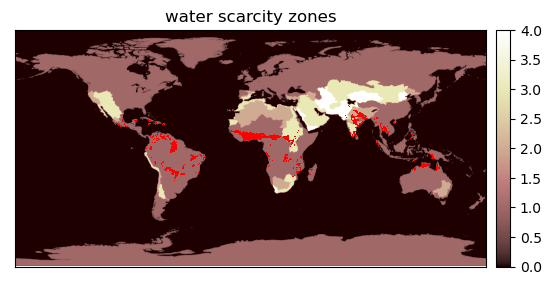

In [52]:
rst_water = r'data/Bioclimatic and ecological zones/WaterScarcity_GAEZ.tif'
plot_tiffs(rst_water, 'pink', 'water scarcity zones')

<b>Land resource dominant cover

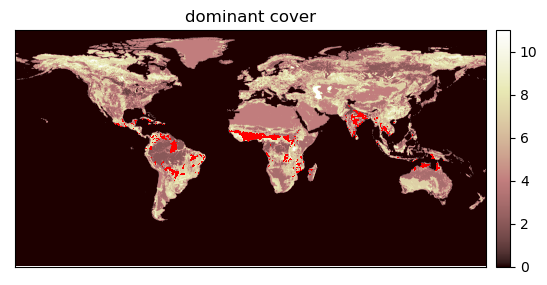

In [53]:
rst_dom = r'data/Bioclimatic and ecological zones/LandResource_DomLandCover_GAEZ.tif'
plot_tiffs(rst_dom, 'pink', 'dominant cover')

<b> Soil Resource Nutrient Avilability </b>

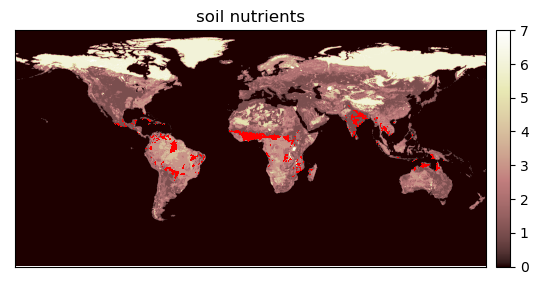

In [54]:
nutrient = r'data/Bioclimatic and ecological zones/SoilResources_NutrientAvailability_GAEZ.tif'
plot_tiffs(nutrient, 'pink', 'soil nutrients')

<b> Terrain sustainability</b>

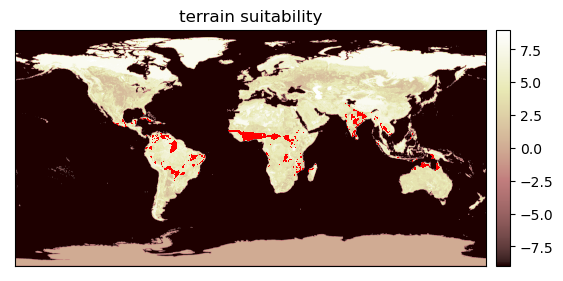

In [55]:
terrsuit = r'data/Bioclimatic and ecological zones/SoilResources_RainfedSoilTerrainSuitability_GAEZ.tif'
plot_tiffs(terrsuit, 'pink', 'terrain suitability')

<b> Rooting conditions </b>

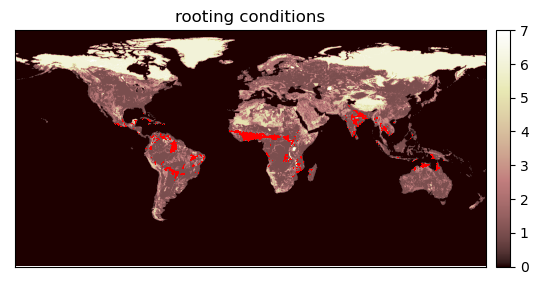

In [56]:
rst_root = r'data/Bioclimatic and ecological zones/SoilResources_RootingConditions_GAEZ.tif'
plot_tiffs(rst_root, 'pink', 'rooting conditions')